# Comparison of Image Sources
Conclusion based on one test case:
1. Duck Duck Go is faster than Bing
2. Bing provides results of good quality further into the search results

In [ ]:
from fastai.vision.all import *

In [ ]:
# Reference: https://keestalkstech.com/2020/05/plotting-a-grid-of-pil-images-in-jupyter/
# Functions are from the above blog
#  - Modified to use Image from fastai instead of PIL
#  - Simplified image download and added resizing

import matplotlib.pyplot as plt
from fastai.vision.all import Image
import requests
from urllib.parse import urlparse
import textwrap

def url_to_image(url:str, size:Optional[int]=None) -> Image:
    try:
        im = Image.open(requests.get(url, stream=True).raw)
    except:
        return None
    
    if size is not None:
        (iw, ih) = im.size
        im = im.crop_pad(min(iw, ih))
        im = im.resize((size, size))
        
    im.filename = urlparse(url).path
    
    return im

def display_images(
    images: [Image], 
    columns=5, width=20, height=4, max_images=50, 
    label_wrap_length=50, label_font_size=8):

    if not images:
        print("No images to display.")
        return 

    if len(images) > max_images:
        print(f"Showing {max_images} images of {len(images)}:")
        images=images[0:max_images]

    height = max(height, int(len(images)/columns) * height)
    plt.figure(figsize=(width, height))
    for i, image in enumerate(images):

        plt.subplot(int(len(images) / columns + 1), columns, i + 1)
        plt.imshow(image)

        if hasattr(image, 'filename'):
            title=image.filename
            if title.endswith("/"): title = title[0:-1]
            title=os.path.basename(title)
            title=textwrap.wrap(title, label_wrap_length)
            title="\n".join(title)
            plt.title(title, fontsize=label_font_size); 

## Duck Duck Go

In [ ]:
from duckduckgo_search import ddg_images

def search_images_with_duckduckgo(term, max_images=20):
    print(f"Searching for '{term}'")
    return L(ddg_images(term, max_results=max_images)).itemgot('image')

In [ ]:
%%time
urls_ddg = search_images_with_duckduckgo('sailboat photo', max_images=300)

Searching for 'sailboat photo'
CPU times: total: 31.2 ms
Wall time: 2.13 s


### Early Search Results
Early search results look okay

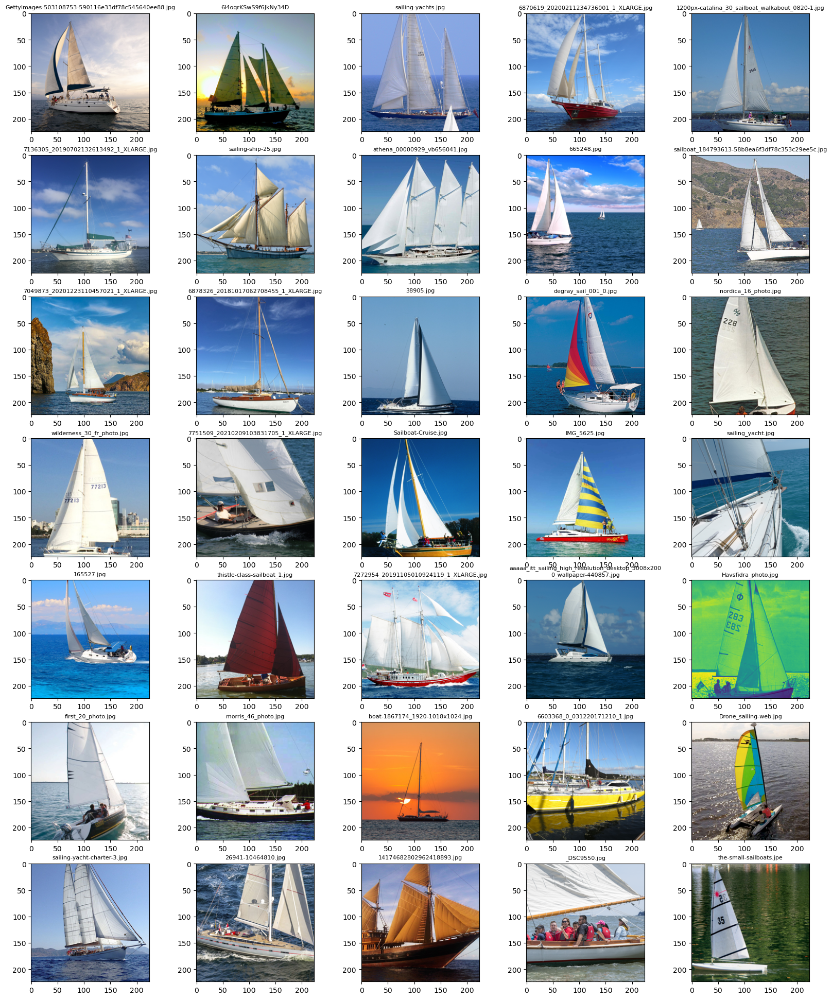

In [ ]:
images_early_ddg = [url_to_image(u, size=224) for u in urls_ddg[:40]]
images_early_ddg = [i for i in images_early_ddg if i is not None]

display_images(images_early_ddg)

### Later Search Results
Still boats, but not ideal

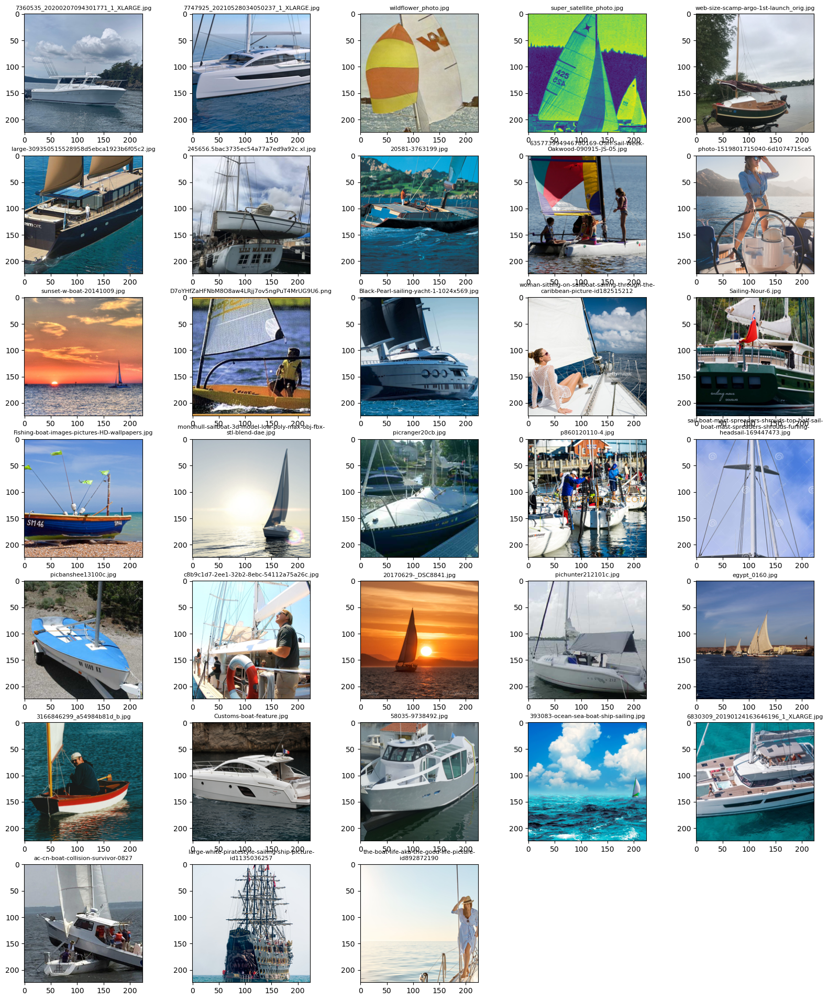

In [ ]:
images_late_ddg = [url_to_image(u, size=224) for u in urls_ddg[-40:]]
images_late_ddg = [i for i in images_late_ddg if i is not None]

display_images(images_late_ddg)

## Bing

In [ ]:
from bing_images import bing

def search_images_with_bing(term, max_images=20, filters=''):
    print(f"Searching for '{term}'")
    return bing.fetch_image_urls(term, limit=max_images, filters=filters)

In [ ]:
%%time
urls_bing = search_images_with_bing('sailboat', max_images=300, filters='+filterui:photo')

Searching for 'sailboat'
Crawled 350 image urls.
CPU times: total: 453 ms
Wall time: 38.9 s


### Early Search Results
Early search results look okay

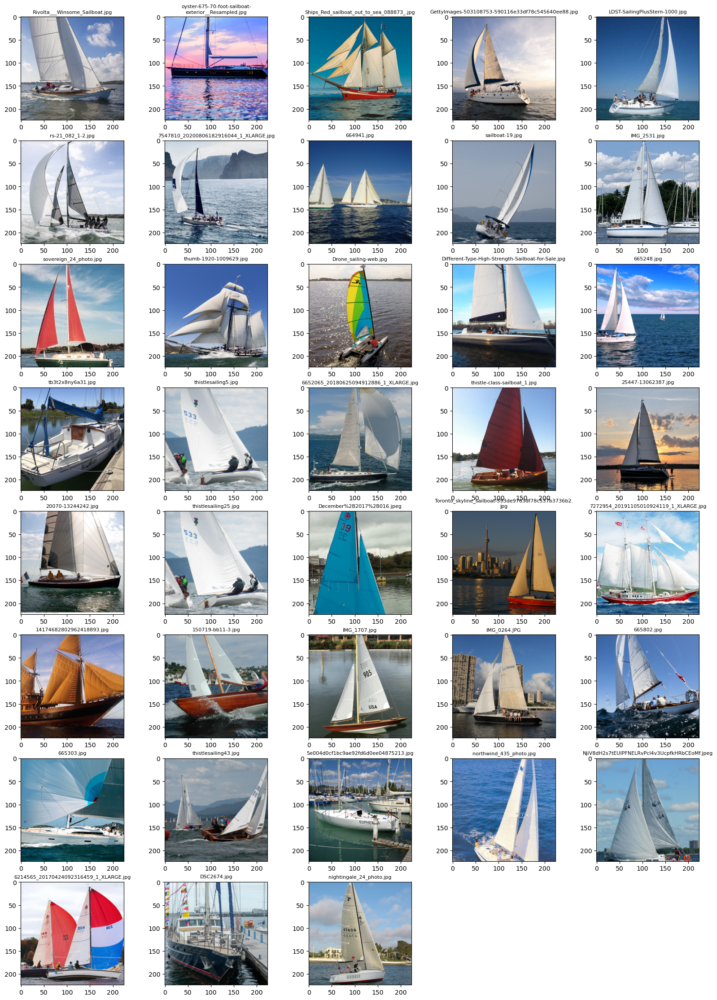

In [ ]:
images_early_bing = [url_to_image(u, size=224) for u in urls_bing[:40]]
images_early_bing = [i for i in images_early_bing if i is not None]

display_images(images_early_bing)

### Later Search Results
Still look fine

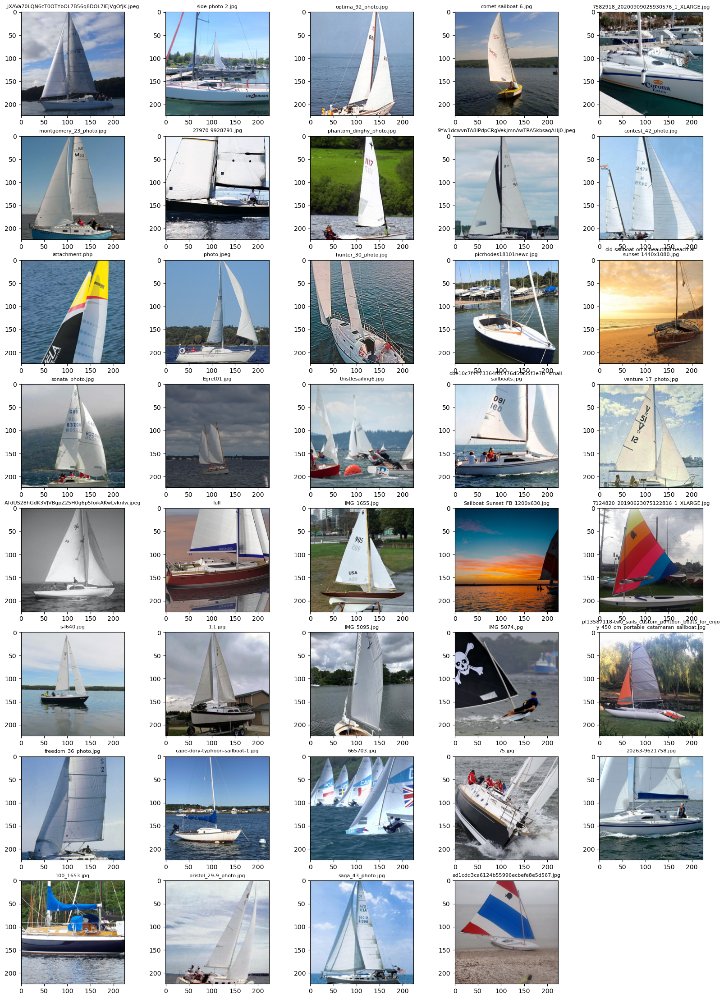

In [ ]:
images_late_bing = [url_to_image(u, size=224) for u in urls_bing[-40:]]
images_late_bing = [i for i in images_late_bing if i is not None]

display_images(images_late_bing)